Dodane pakiety

In [25]:
import numpy as np
import pywt
import pywt.data
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import math
from skimage.restoration import estimate_sigma
from skimage.metrics import peak_signal_noise_ratio
import scipy
import cv2

Import obrazu wykorzystanego podczas operacji przetwarzania i zamiana typu z rgb na black-white

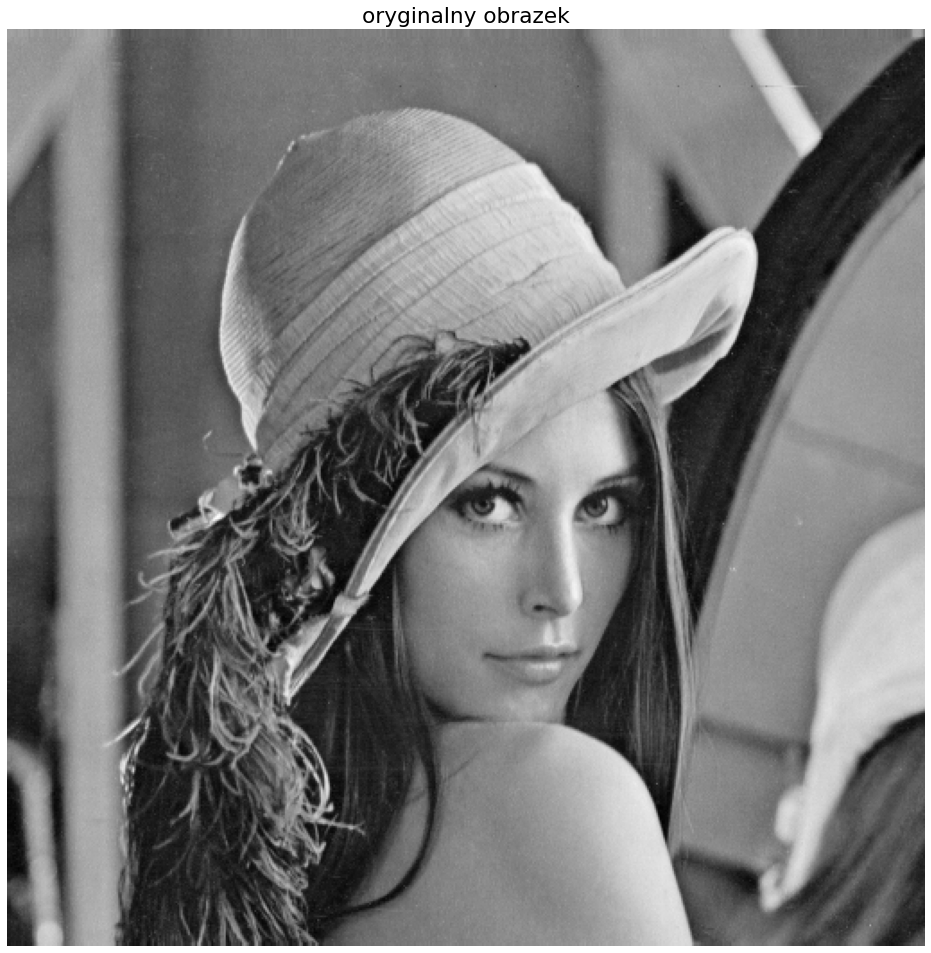

In [26]:
#ustawienie wielkości plotowanego obrazka
plt.rcParams['figure.figsize'] = [13, 13]
plt.rcParams.update({'font.size': 18})
plt.axis('off')

img = mpimg.imread('Lenna.jpg')
img = np.mean(img,-1)#zamiana na obraz czarnobiały

#przetworzenie kolorowego obrazu Lenna na format czarno biały uint8
plt.imsave('lenaoriginal'+'.jpg',img,cmap = 'gray')
plt.title('oryginalny obrazek')
plt.imshow(img, cmap=plt.get_cmap("gray"))


Przypisanie poziomu dekompozycji i nazwy falki macierzystej wykorzystywanej w dalszych operacjach na obrazie

In [27]:
levels = (np.floor(np.log2(img.shape[0]))).astype(int)
#['db1','haar','bior3.8','coif2','db6']
waveletName = 'db1'

print(levels)

9


Wykonanie operacji wielowymiarowej dekompozycji za pomocą falek (poziom 1) (falka macierzysta: db1)

[[ 0.69928315  0.70143369  0.68458781 ... -0.0030349   0.01972686
   0.21699545]
 [ 0.70071685  0.70537634  0.68422939 ... -0.01062215  0.
   0.2215478 ]
 [ 0.70035842  0.68673835  0.68566308 ...  0.02731411  0.06828528
   0.20333839]
 ...
 [-0.08351178  0.07066381  0.01070664 ...  0.07723577  0.1504065
  -0.10569106]
 [ 0.03211991  0.0235546   0.01498929 ...  0.02845528  0.04065041
   0.01626016]
 [ 0.00642398 -0.00214133 -0.00428266 ...  0.          0.02845528
  -0.01626016]]


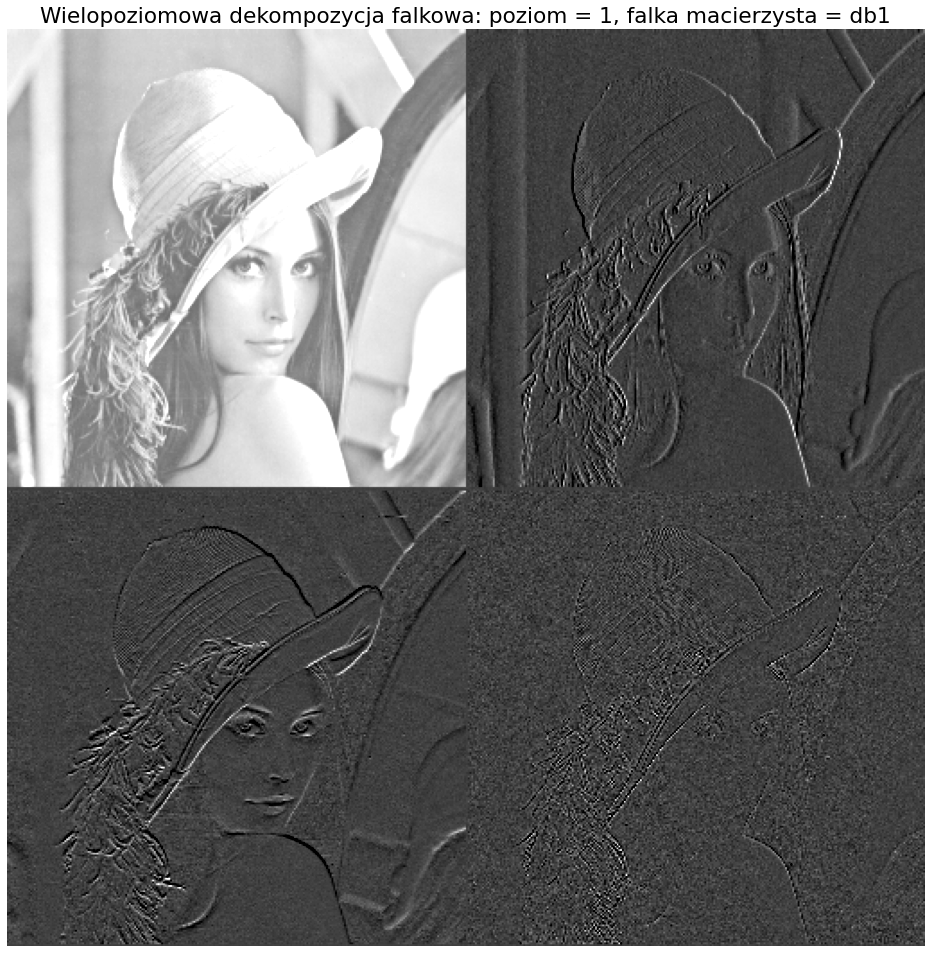

In [28]:
#tryb (zalecany 'periodization' dla każdego z obrazów)
#przetworzony obraz zostaje przechowany w formie listy gdzie elementy oznaczają następująco
#0 -> (array) warstwa przybliżająca danego poziomu falki
#1 -> (tuple3 of arrays) warstwa detali dla ostatniego poziomu dekompozycji 
wavelet_coeffs = pywt.wavedec2(img,wavelet=waveletName,level=1,mode='periodization',axes=(-2,-1))

wavelet_coeffs[0] /= np.abs(wavelet_coeffs[0]).max()
for detail_level in range(1):
    wavelet_coeffs[detail_level + 1] = [d/np.abs(d).max() for d in wavelet_coeffs[detail_level + 1]]

arr, coeff_slices = pywt.coeffs_to_array(wavelet_coeffs)

print(arr)

plt.imshow(arr,cmap='gray',vmin=-0.25,vmax=0.75)

plt.axis('off')
plt.title('Wielopoziomowa dekompozycja falkowa: poziom = 1, falka macierzysta = ' + waveletName)
plt.show()

Wykonanie operacji wielowymiarowej dekompozycji za pomocą falek (poziom 2) (falka macierzysta: db1)

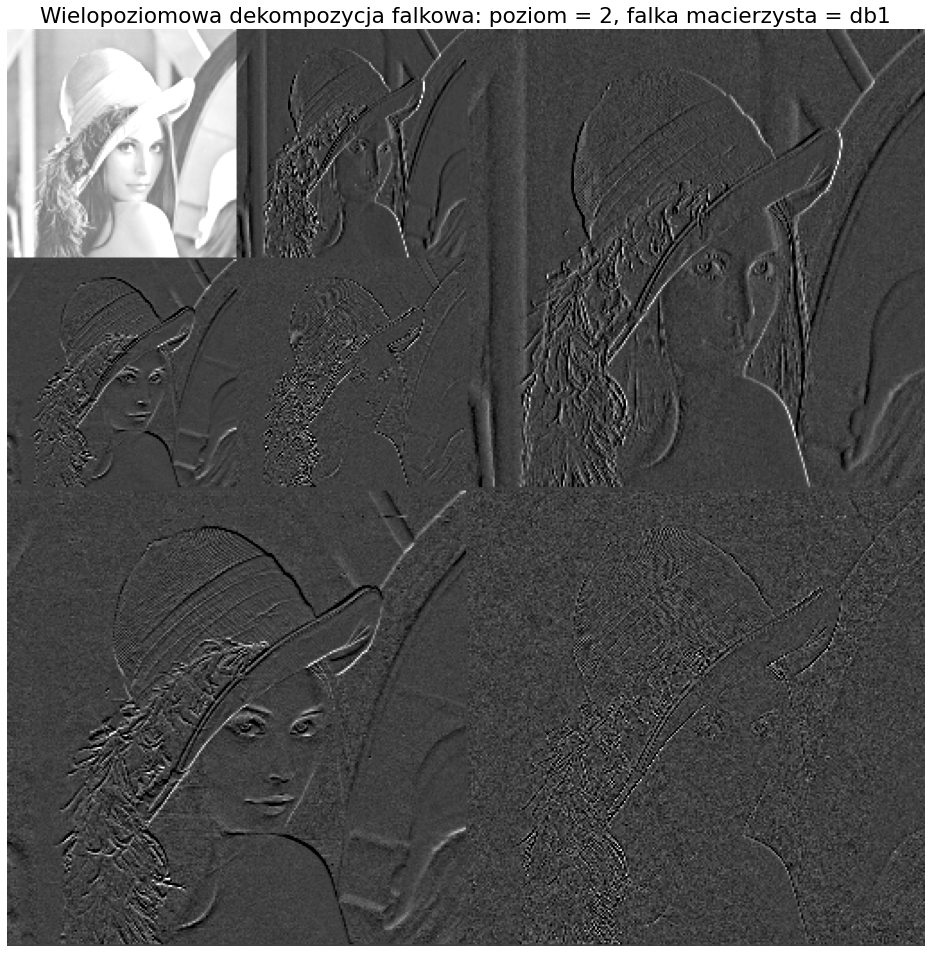

In [29]:
wavelet_coeffs = pywt.wavedec2(img,wavelet=waveletName,level=2,mode='periodization',axes=(-2,-1))

wavelet_coeffs[0] /= np.abs(wavelet_coeffs[0]).max()
for detail_level in range(2):
    wavelet_coeffs[detail_level + 1] = [d/np.abs(d).max() for d in wavelet_coeffs[detail_level + 1]]

arr, coeff_slices = pywt.coeffs_to_array(wavelet_coeffs)

plt.imshow(arr,cmap='gray',vmin=-0.25,vmax=0.75)

plt.axis('off')
plt.title('Wielopoziomowa dekompozycja falkowa: poziom = 2, falka macierzysta = ' + waveletName)
plt.show()

Wykonanie operacji wielowymiarowej dekompozycji za pomocą falek (poziom: maksymalny) (falka macierzysta: db1)

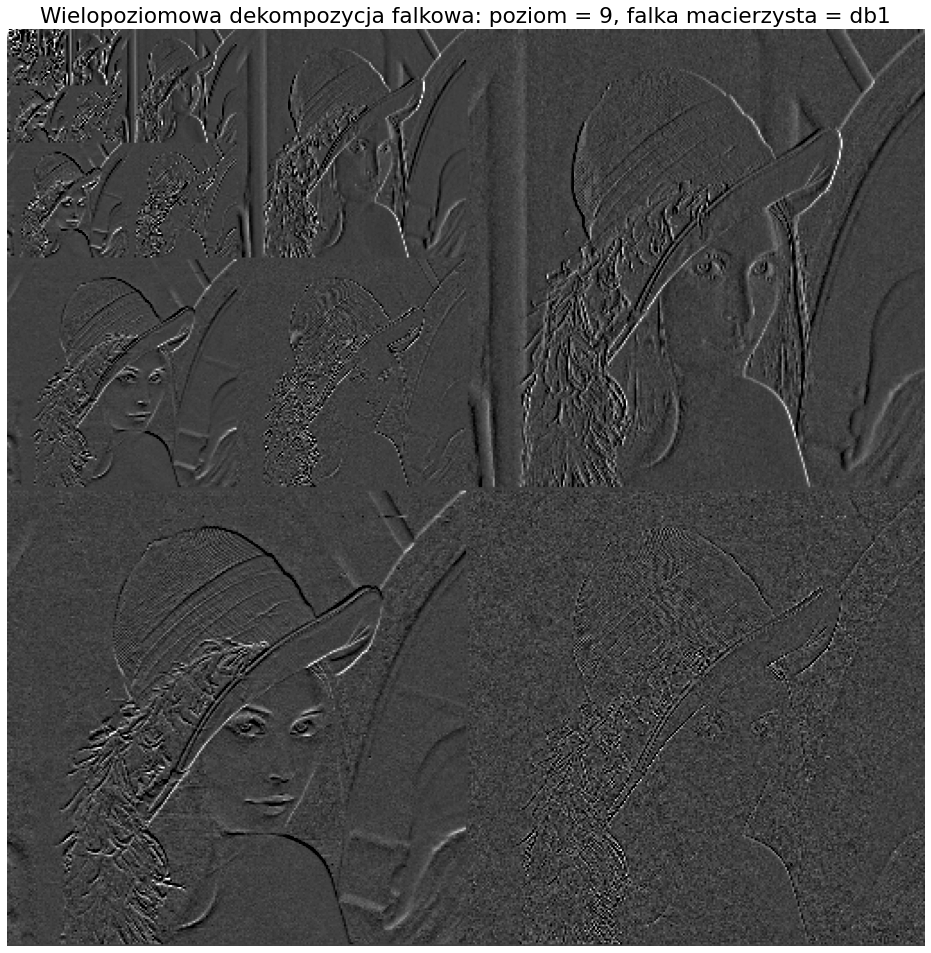

In [30]:
wavelet_coeffs = pywt.wavedec2(img,wavelet=waveletName,level=levels,mode='periodization',axes=(-2,-1))

wavelet_coeffs[0] /= np.abs(wavelet_coeffs[0]).max()
for detail_level in range(levels):
    wavelet_coeffs[detail_level + 1] = [d/np.abs(d).max() for d in wavelet_coeffs[detail_level + 1]]

arr, coeff_slices = pywt.coeffs_to_array(wavelet_coeffs)

plt.imshow(arr,cmap='gray',vmin=-0.25,vmax=0.75)

plt.axis('off')
plt.title('Wielopoziomowa dekompozycja falkowa: poziom = '+str(levels)+', falka macierzysta = ' + waveletName)
plt.show()

Wykonanie odwrotnej operecji wielopoziomowej dekompozycji

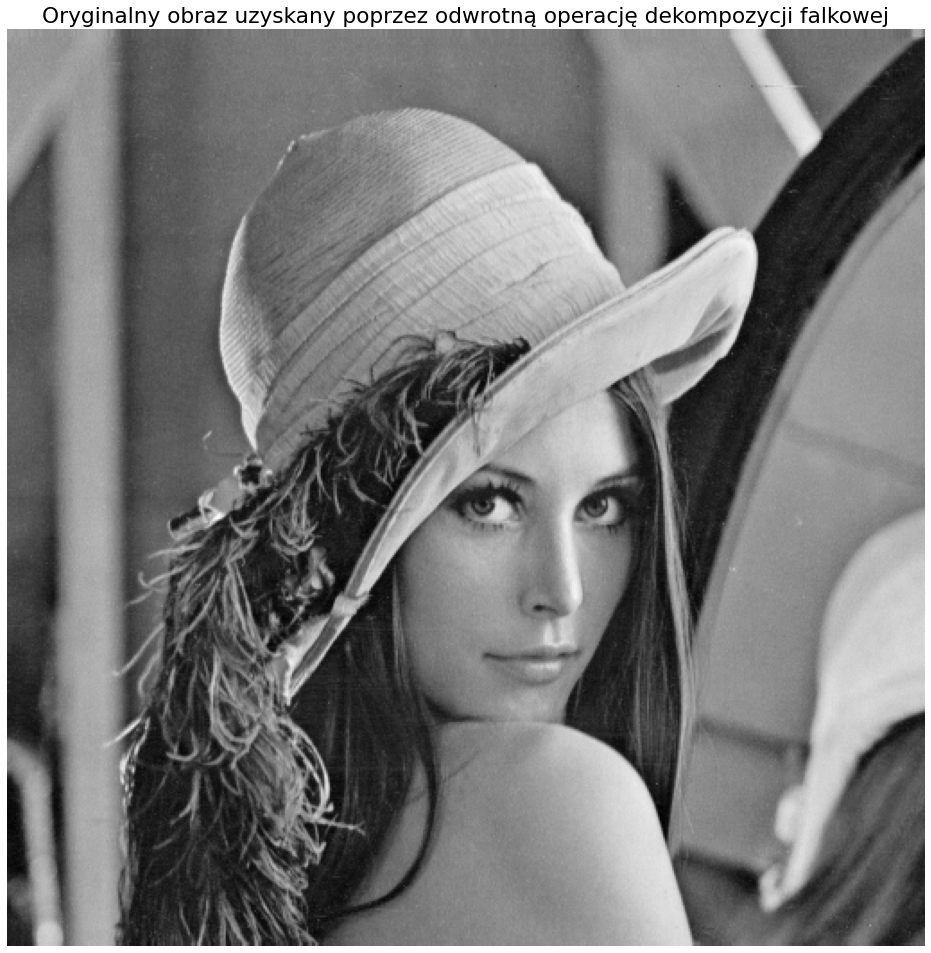

In [31]:
wavelet_coeffs = pywt.wavedec2(img,wavelet=waveletName,level=1,mode='periodization',axes=(-2,-1))

invarseOperationImage = pywt.waverec2(wavelet_coeffs,wavelet=waveletName,mode='periodization',axes=(-2,-1))

plt.axis('off')
plt.title('Oryginalny obraz uzyskany poprzez odwrotną operację dekompozycji falkowej')
plt.imshow(invarseOperationImage, cmap=plt.get_cmap("gray"))

Wykorzystanie falek do kompresji obrazu

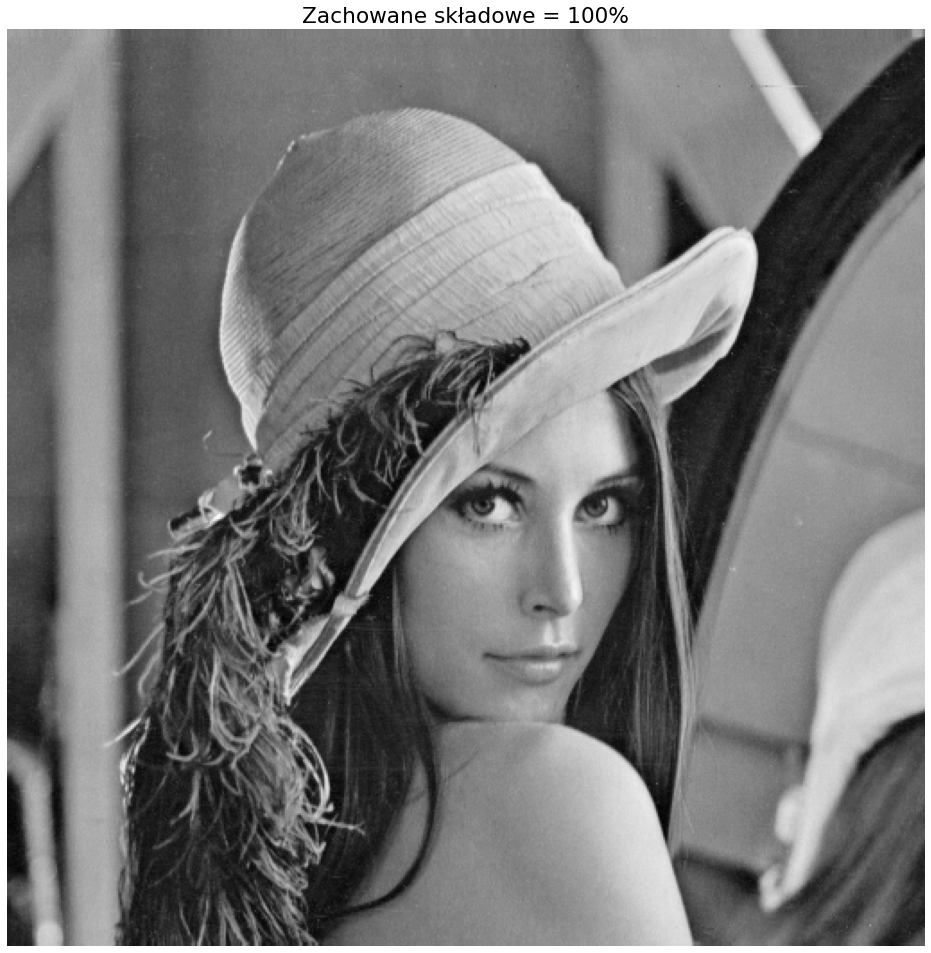

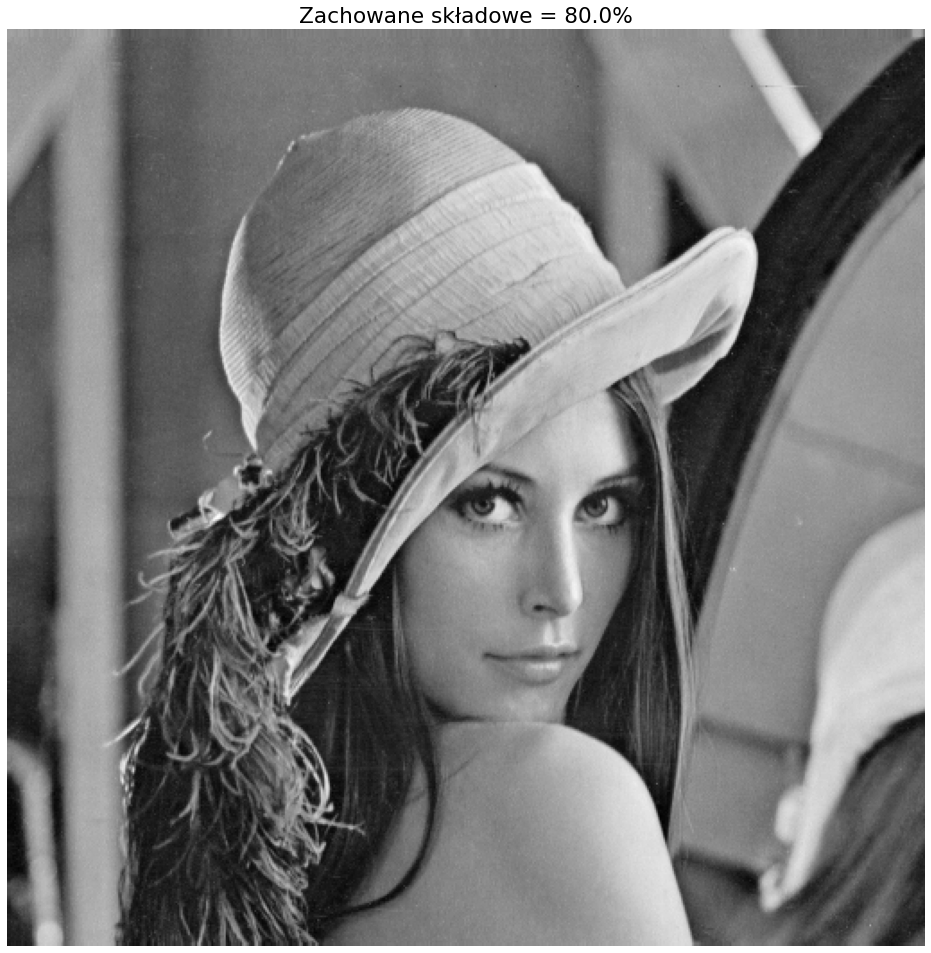

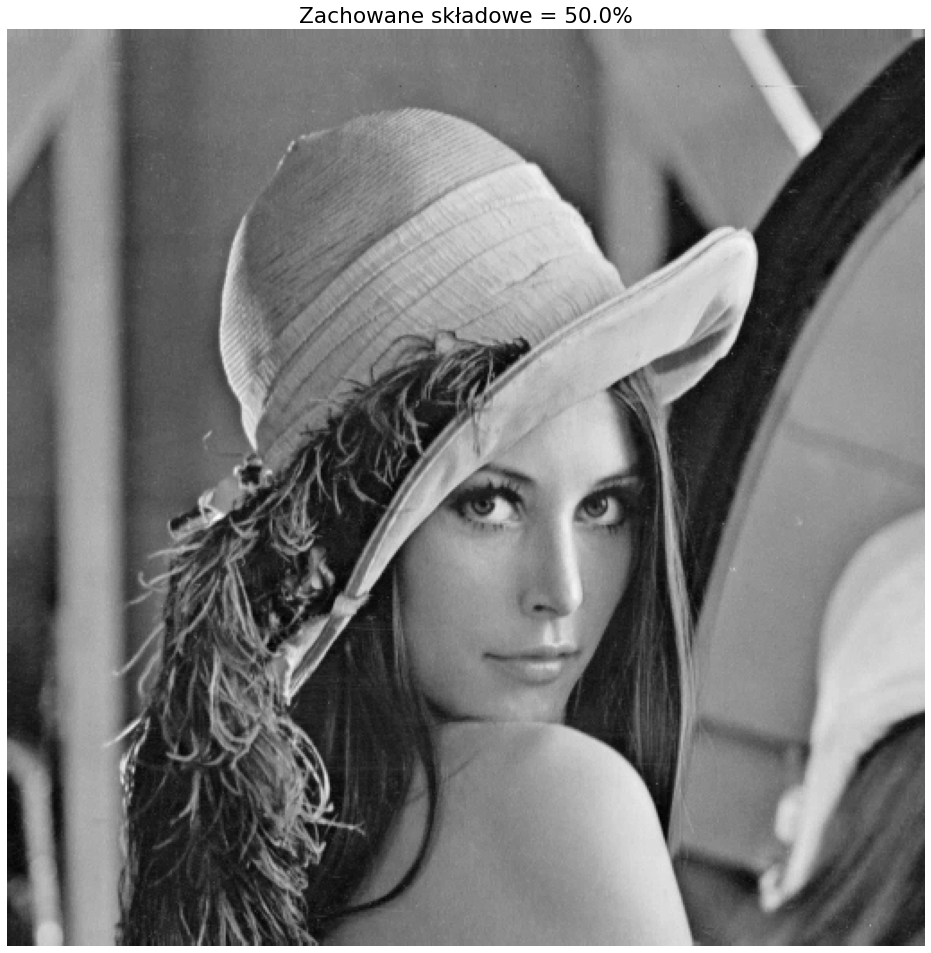

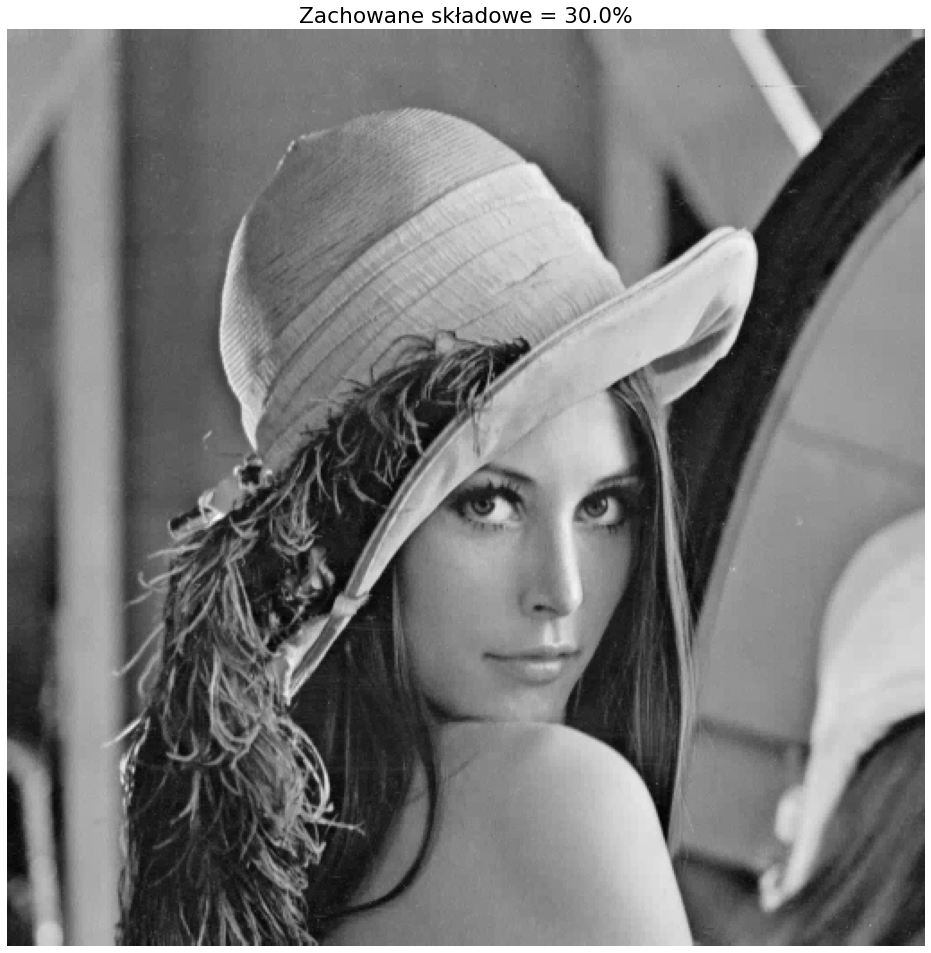

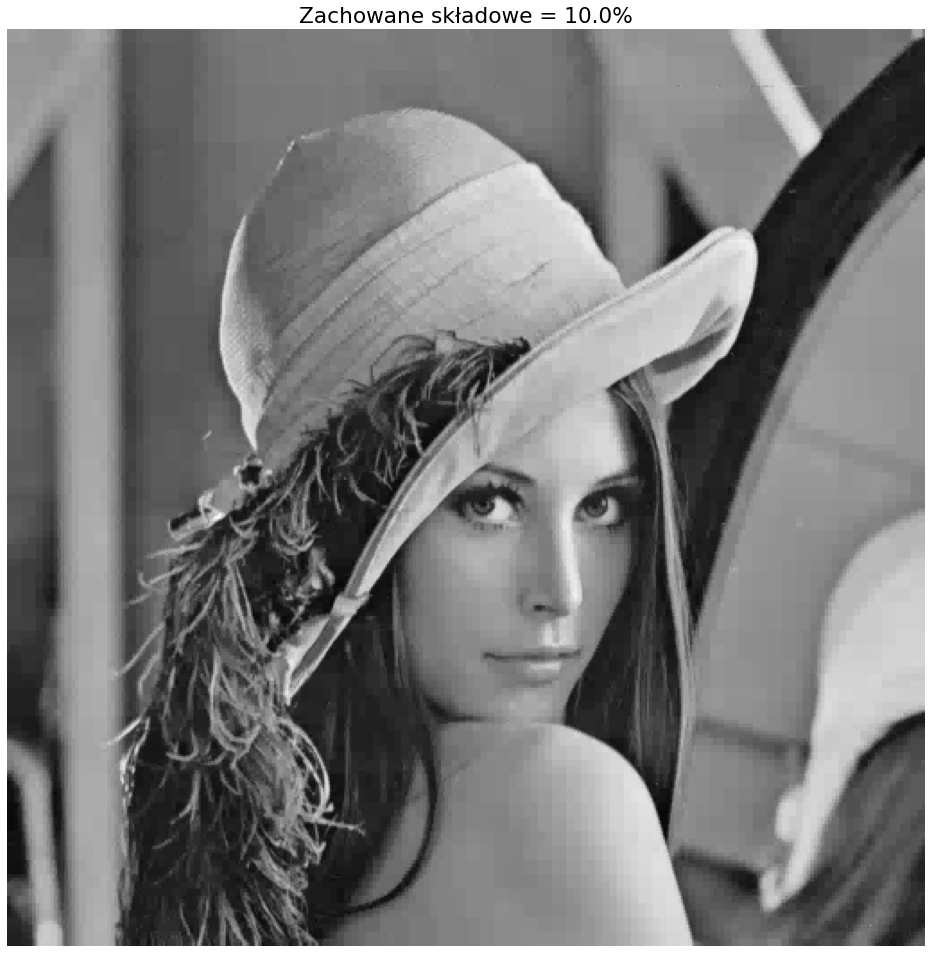

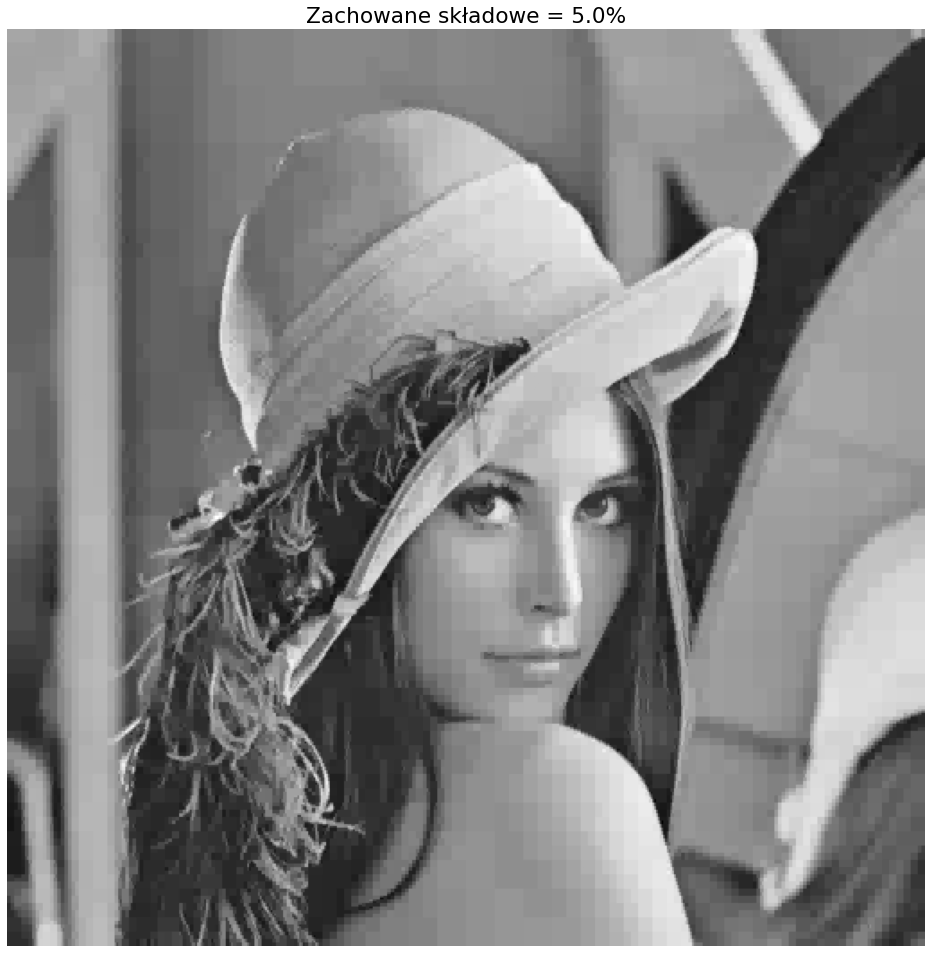

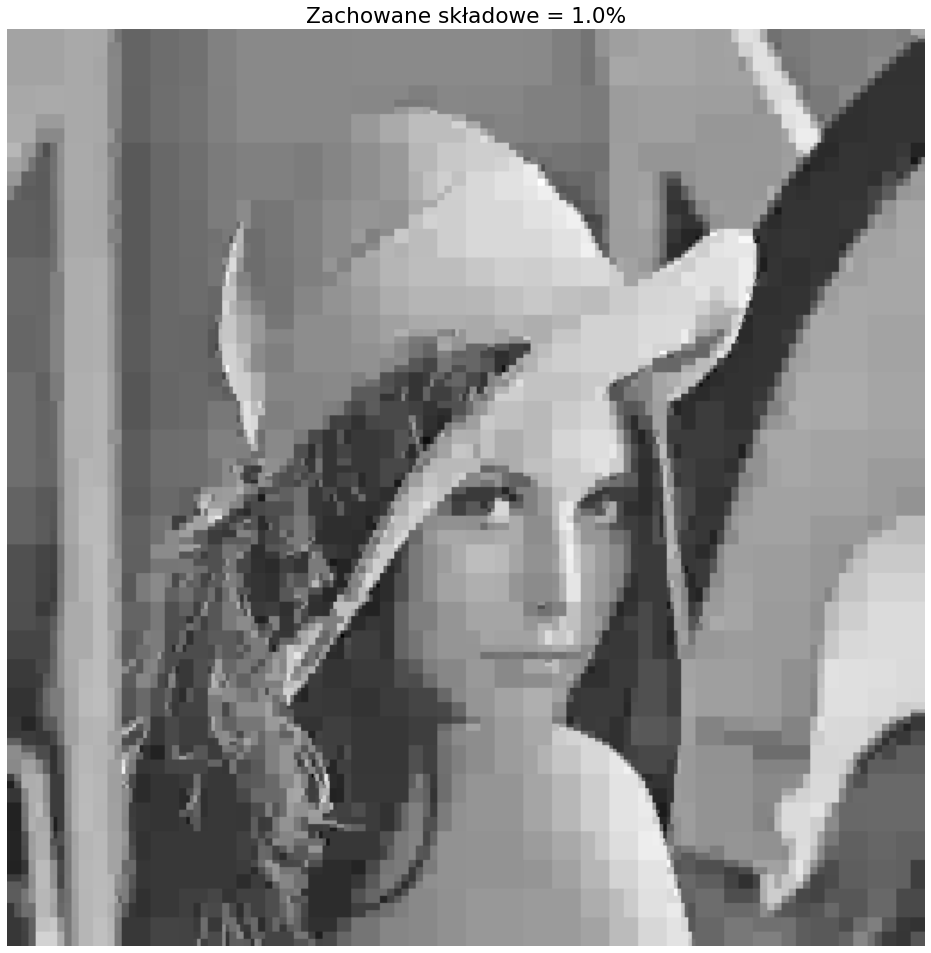

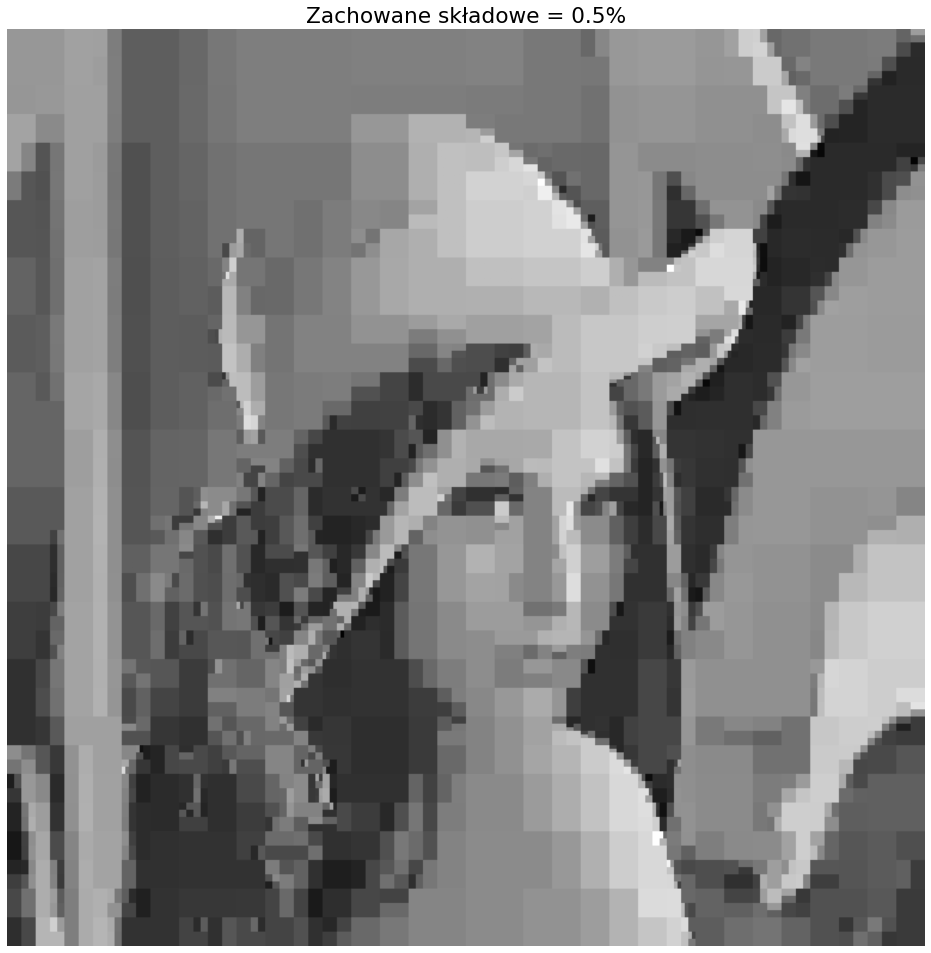

In [32]:
waveletName = 'db1'

coeffs = pywt.wavedec2(img,wavelet=waveletName,level=levels)

coeff_arr, coeff_slices = pywt.coeffs_to_array(coeffs)

Csort = np.sort(np.abs(coeff_arr.reshape(-1)))

for keep in (1,0.8,0.5,0.3,0.1, 0.05, 0.01, 0.005):
    thresh = Csort[int(np.floor((1-keep)*len(Csort)))]
    ind = np.abs(coeff_arr) > thresh
    Cfilt = coeff_arr * ind 

    coeffs_filt = pywt.array_to_coeffs(Cfilt,coeff_slices,output_format='wavedec2')
    
    
    Arecon = pywt.waverec2(coeffs_filt,wavelet=waveletName)
    plt.figure()
    plt.imshow(Arecon.astype('uint8'),cmap='gray')
    plt.axis('off')
    plt.title('Zachowane składowe = ' + str(keep*100)+'%')
    plt.imsave('lenacompressed'+str(keep)+'.png',Arecon.astype('uint8'),cmap = 'gray')

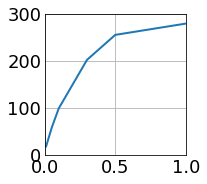

In [15]:
plt.style.use('_mpl-gallery')

# make data
x = [1,0.5,0.3,0.1, 0.05, 0.01]
y = [280, 256, 203, 100,59,19]

# plot
fig, ax = plt.subplots()

ax.plot(x, y, linewidth=2.0)

ax.set(xlim=(0, 1),
       ylim=(0, 300))

plt.show()

Wykorzystanie falek do odszumiania obrazu

Dodanie szumu do badanego zdjęcia

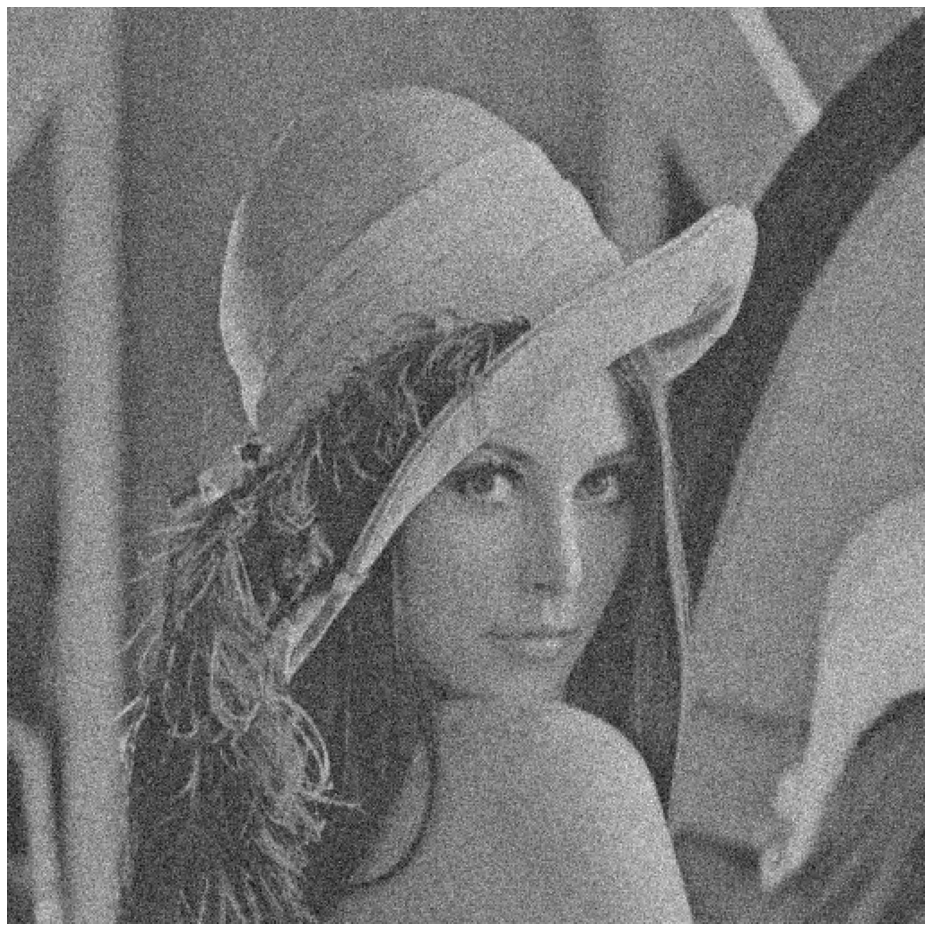

In [33]:
noiseSigma = 27.0
noisedImg = img.copy()
noisedImg += np.random.normal(0, noiseSigma, size=img.shape)

plt.axis('off')
plt.imshow(noisedImg, cmap=plt.get_cmap("gray"))

Implementacja funkcji odszumiającej obraz za pomocą operacji opartych na falkach

In [34]:
def denoiseImage(image, waveletLvl,waveletName,thresholdMode):
    #threshold = noiseSigma*np.sqrt(2*np.log2(image.size))
    threshold = estimate_sigma(image,average_sigmas = True)/0.8
    denoisedCoeffs = []
    waveletCoeffs = pywt.wavedec2( image, wavelet=waveletName, level=waveletLvl)
    print(len(waveletCoeffs))
    cA = waveletCoeffs[0]
    denoisedCoeffs.append(cA)

    detailCoeffs = waveletCoeffs[1:]
    
    for dC in detailCoeffs:
        c0,c1,c2 = dC
        c0 = pywt.threshold(c0,threshold,mode = thresholdMode)
        c1 = pywt.threshold(c1,threshold,mode = thresholdMode)
        c2 = pywt.threshold(c2,threshold,mode = thresholdMode)
        denoised_tupleDetails = (c0,c1,c2)
        denoisedCoeffs.append(denoised_tupleDetails)
    
    print(len(denoisedCoeffs))

    return pywt.waverec2(denoisedCoeffs, wavelet=waveletName)

Wykorzystanie funkcji denoiseImage w celu usunięcia zakłoceń w postaci szumu z obrazu

10
10


c:\Users\Adam\AppData\Local\Programs\Python\Python310\lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(


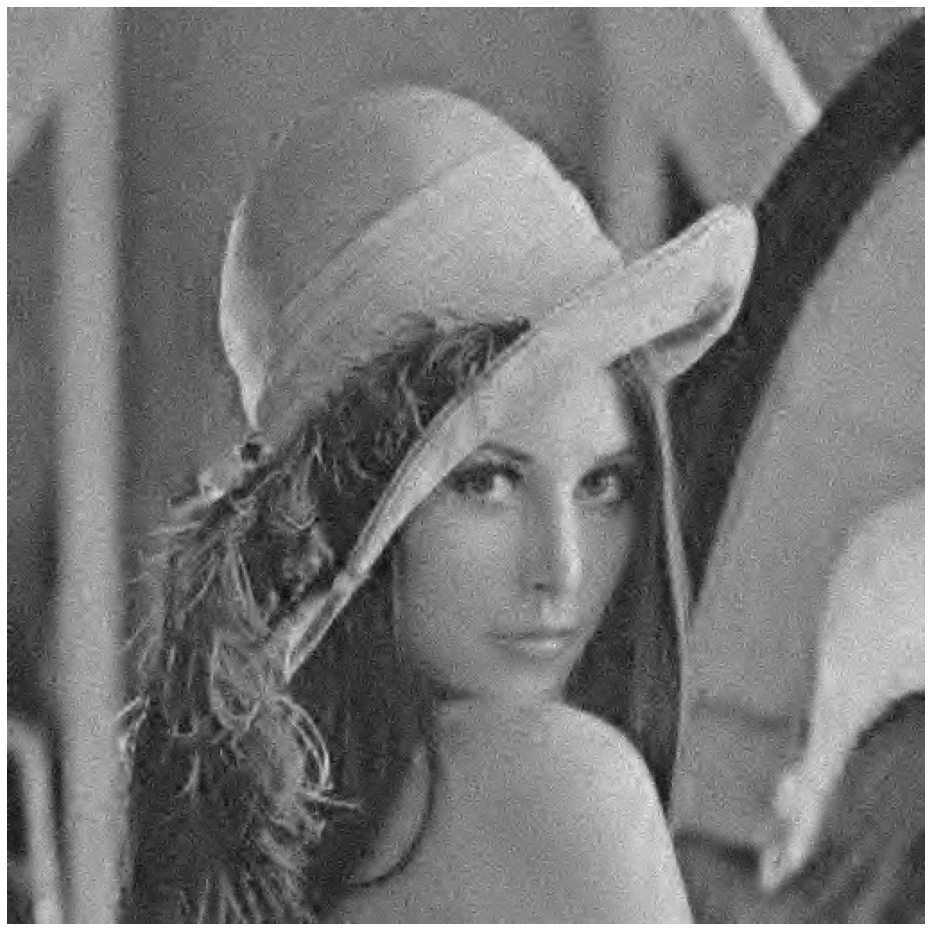

In [35]:
waveletName = 'bior6.8'
thresholdMODE = 'soft'

denoisedImage = denoiseImage(noisedImg,levels,waveletName,thresholdMODE)
plt.axis('off')
plt.imshow(denoisedImage, cmap=plt.get_cmap("gray"))

Wykorzystanie kryteriów załaczonych w pakiecie skimag w celu analizy jakości odszumiania

In [36]:
psnr_noisy = peak_signal_noise_ratio(img.astype('uint8'),noisedImg.astype('uint8'))
psnr_wavelet = peak_signal_noise_ratio(img.astype('uint8'),denoisedImage.astype('uint8'))
print('PSNR [Original vs Noisy Image]: ',psnr_noisy)
print('PSNR [Original vs Denoised Image]: ',psnr_wavelet)

PSNR [Original vs Noisy Image]:  18.65635305866141
PSNR [Original vs Denoised Image]:  27.233167521329925


Wykorzystanie falek w celu wykrywania krawędzi obrazu

Implementacja funkcji wykorzystywanej w celu progowanie obrazu (skala szarości -> (0,1))

In [42]:
from sklearn.preprocessing import MinMaxScaler

def performThresholding(img_input,val_threshold,isFinalImg):
    low_values_indices = abs(img_input) < val_threshold
    img_input[low_values_indices] = 0

    if isFinalImg:
        low_values_indices = img_input > 0
        img_input[low_values_indices] = 255
    return img_input

def upSample(img_input,order):
    img_out = scipy.ndimage.zoom(img_input,order)
    return img_out

def edgeDetection(img,waveletName,levels,threshhold):
   # wavelet_coeffs = pywt.wavedec2( img, wavelet=waveletName, level=levels)
    #wavelet_coeffs[0] /= np.abs(wavelet_coeffs[0]).max()
    #for detail_level in range(levels):
     #   wavelet_coeffs[detail_level + 1] = [d/np.abs(d).max() for d in wavelet_coeffs[detail_level + 1]]

    wavelet_coeffs = pywt.wavedec2(img,wavelet=waveletName,level=levels,mode='periodization',axes=(-2,-1))

    #wavelet_coeffs[0] /= np.abs(wavelet_coeffs[0]).max()
    #for detail_level in range(levels):
     #   wavelet_coeffs[detail_level + 1] = [d/np.abs(d).max() for d in wavelet_coeffs[detail_level + 1]]

    #print(wavelet_coeffs[8][0])

    detail_coeffs = []
    threshold_detal_coeffs = []

    #zbierz wszytkie warstwy detali
    for i in range(len(wavelet_coeffs)-1):
        detail_coeffs.append(wavelet_coeffs[i+1])

     
    #wykonaj threshhold na wszystkich warstwach
    for image in detail_coeffs:
        image = list(image)
        image[0] = performThresholding(image[0],threshhold,False)
        image[1] = performThresholding(image[1],threshhold,False)
        image[2] = performThresholding(image[2],threshhold,False)
        threshold_detal_coeffs.append(image)

    #print(detail_coeffs[2])
    while len(threshold_detal_coeffs) != 1:
        (c_H,c_V,c_D) = threshold_detal_coeffs[0]
        
        c_H = upSample(c_H,2)
        c_V = upSample(c_V,2)
        c_D = upSample(c_D,2)

        threshold_detal_coeffs.pop(0)
        
        threshold_detal_coeffs[0][0] = c_H*threshold_detal_coeffs[0][0]
        threshold_detal_coeffs[0][1] = c_V*threshold_detal_coeffs[0][1]
        threshold_detal_coeffs[0][2] = c_D*threshold_detal_coeffs[0][2]
    
    c_H = threshold_detal_coeffs[0][0]
    c_V = threshold_detal_coeffs[0][1]
    c_D = threshold_detal_coeffs[0][2]
    
    cHFinal = np.multiply(c_H,c_H)
    cVFinal = np.multiply(c_V,c_V)
    cDFinal = np.multiply(c_D,c_D)
    imgEdgesFinal = np.sqrt(cHFinal+cVFinal+cDFinal)
    #imgEdgesFinal /= np.abs(imgEdgesFinal).max()

    #print(len(threshold_detal_coeffs))
    #print(threshold_detal_coeffs[0][0].shape)
    

    return imgEdgesFinal

        


    
    

    



Użycie funkcji performThreshholding na współczynnikach z detalami obrazu w celu zakcentowania krawędzi na obrazie

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.90484827e+17 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


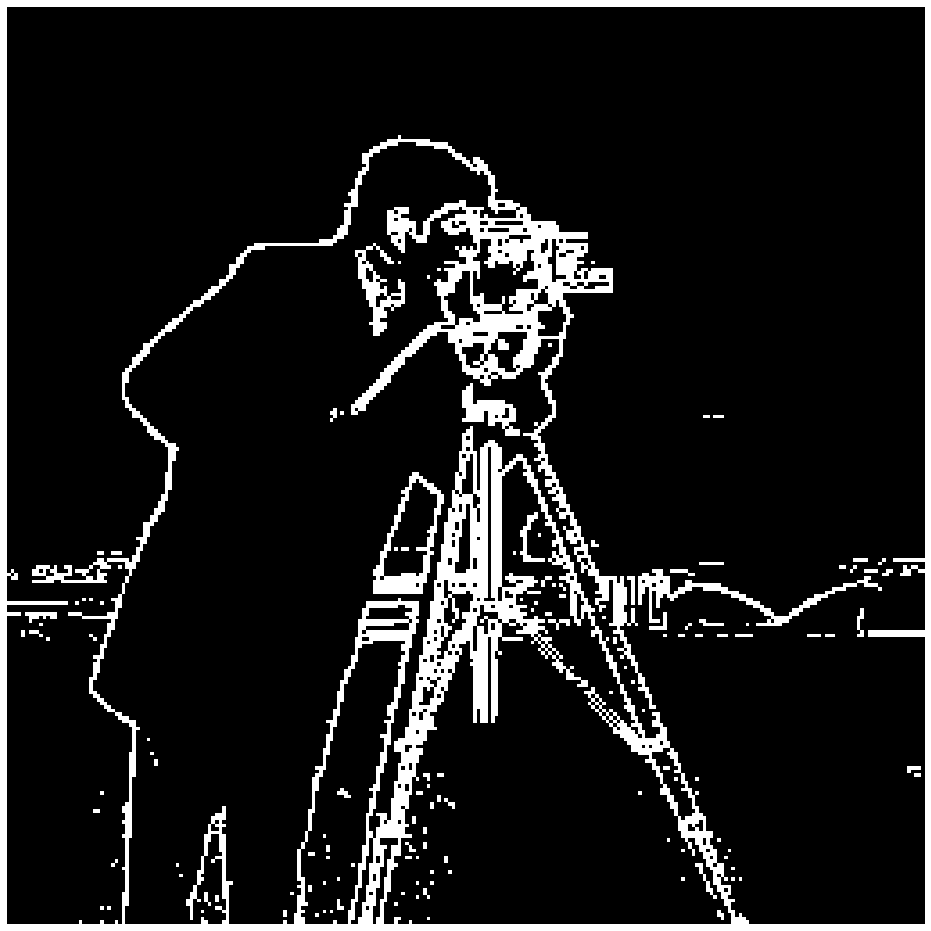

In [51]:
waveletName = 'haar'
#wavelet_coeffs = pywt.wavedec2( img, wavelet=waveletName, level=levels)

#wavelet_coeffs[0] /= np.abs(wavelet_coeffs[0]).max()
#for detail_level in range(levels):
    #wavelet_coeffs[detail_level + 1] = [d/np.abs(d).max() for d in wavelet_coeffs[detail_level + 1]]

#cA = wavelet_coeffs[0]
#(cH,cV,cD) = wavelet_coeffs[-1]

#performThresholding(cH,0.06,False)
#performThresholding(cV,0.06,False)
#performThresholding(cD,0.06,False)

#edgesImg = cH+cV+cD
#print(edgesImg.shape)
#plt.imshow(edgesImg, cmap=plt.get_cmap("gray"))
#edgesImg = upSample(edgesImg,2)
#print(edgesImg.shape)
plt.axis('off')
#plt.imshow(edgesImg, cmap=plt.get_cmap("gray"))
#img = cv2.imread('Lenna.jpg')
#img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

img = mpimg.imread('camera.jpg')
#img = np.mean(img,-1)#zamiana na obraz czarnobiały
edgeImg = edgeDetection(img,waveletName,9,16)
print(edgeImg)
edgeImg  = performThresholding(edgeImg,10000000000000000000000,True)
plt.imshow(edgeImg, cmap='gray')

